# MTH3302 : Méthodes probabilistes et statistiques pour l'I.A.

Jonathan Jalbert<br/>
Professeur adjoint au Département de mathématiques et de génie industriel<br/>
Polytechnique Montréal<br/>


Le projet a été préparé par Gabriel Gobeil, associé de recherche à Polytechnique Montréal.

---
# Projet A2022 : Récolte des cerfs de Virginie


La description du projet est disponible à l'adresse suivante : https://www.kaggle.com/t/23b6d8c44f1247c78e19a6a902f804af

Ce calepin Jupyter de base permet de charger et de nettoyer les données fournies. La dernière section détaille la génération du fichier des prédictions afin de le soumettre sur Kaggle dans le bon format.

### Données

Dans un premier temps, vous devrez récupérer les données sur Kaggle. Les fichiers disponibles sont les suivants :
- recolte.csv
- permis.csv
- meteo.csv
- essence.csv
- test.csv

**Déposez ces fichiers dans un dossier nommé *data* dans le répertoire de ce calepin.**

Le fichier *recolte.csv* contient les statistiques de chasse au cerf de Viriginie. On y retrouve le nombre de cerfs mâles adultes récoltés annuellement dans certaines zones de chasse du Québec, listé selon le type d'engin utilisé.

Le fichier *permis.csv* contient des informations sur le nombre de permis de chasse aux cerfs de Virginie alloués aux résidents et non-résidents de 1999 à 2020.

Le fichier *meteo.csv* contient certaines variables météorologiques enregistrées à la station Montréal-Trudeau de 1999 à 2021 :
- Mean Temp (°C)	
- Total Rain (mm)	
- Total Snow (cm)	
- Snow on Grnd (cm)

Le fichier *essence.csv* contient des informations sur le prix de détail moyen par mois de l'essence pour Québec et Montréal de 1999 à 2021. Des renseignements additionnels sur les données sont disponibles à l'adresse suivante : https://www150.statcan.gc.ca/t1/tbl1/fr/cv.action?pid=1810000101

Le fichier *test.csv* contient les zones de chasse pour lesquels vous devez prédire le nombre de cerfs mâles adultes récoltés pour l'année 2021, peu importe l'engin de chasse utilisé. La qualité de vos prédictions sera ensuite évaluée lorsque vous les téléverserez sur Kaggle. Vos prédictions seront comparées à celles des autres équipes de la classe.

### Consignes

- Vous devez constituer une équipe de 3 à 5 personnes.
- Au moins une solution doit être proposée sur Kaggle.
- Utilisez votre identifiant d'équipe pour téléverser vos prédictions sur Kaggle.
- Un seul calepin *.ipynb* par équipe doit être remis. Ce fichier documente et illustre la procédure qui vous a permis de produire vos meilleures prédictions. Ce fichier constitue le rapport final du projet.
- Le langage Julia doit être utilisé.
- Votre démarche doit être rigoureusement justifiée (consultez la grille de correction pour vous orienter).

### Quelques conseils

Votre calepin doit permettre à une personne à l'extérieur de l'équipe de comprendre votre démarche et de reproduire vos résultats. Par exemple, une bonne façon de faire consiste à expliquer dans une cellule de texte la tâche qui est accomplie dans la cellule de code suivante. 

Je vous encourage fortement à faire une analyse exploratoire des données pour développer une meilleure expertise du problème. C'est une étape qui est toujours négligée mais qui est essentielle. C'est avec l'analyse exploratoire que vous viendra des idées d'amélioration, comme par exemple créer de nouvelles variables explicatives.

Vous pouvez utiliser directement tout ce qui se trouve dans les notes de cours sans explication et toutes les librairies utilisées dans le cours (incluant mes fonctions).

Ce calepin contient un modèle très simple de prédiction : on n'utilise qu'une seule variable explicative. Ce sera votre travail d'améliorer ces prédictions avec la méthode et les variables de votre choix.

S'il y a des données manquantes, ce sera à vous de traiter ce problème. La plupart du temps, une méthode simple d'imputation (de remplacement) des données manquantes est suffisante.

Prenez la peine de documenter succinctement les essais infructueux. Ce n'est pas nécessaire de les expliquer en détails, mais c'est important de les mentionner dans la discussion avec une raison possible de leur échec. De cette façon, une personne qui reprendra votre travail dans le futur ne perdra pas de temps à réessayer une méthode infructueuse déjà testée.

Vous pouvez aussi indiquer dans votre rapport les raisons qui vous font croire pourquoi une méthode a moins bien performée de ce qui était attendu. Vous pouvez également mentionner ce que vous auriez pu tenter si vous aviez eu plus de temps ou plus de données. L'idée est de guider l'analyste qui prendrait la relève de votre travail.

Vous êtes limités à deux soumissions par jour UTC par équipe sur Kaggle. Je vous suggère donc de bien tester vos modèles localement et de ne téléverser que vos meilleurs prédictions de la journée.

In [2]:
using CSV, DataFrames, Statistics, Dates, Gadfly

---
## 1. Chargement de données

#### Récolte annuelle de cerfs par zones de chasse selon les différents engins

In [3]:
recolte = CSV.read("data/recolte.csv", DataFrame)
first(recolte, 5)

,Année,Zone,Engin,Cerfs
,Int64,Int64,String15,Int64
1,1999,2,Arc,58
2,1999,2,Carabine,852
3,1999,2,Indéterminé,12
4,1999,3,Arc,94
5,1999,3,Carabine,1422


#### Nombre de permis de chasse alloués annuellement aux résidents et non-résidents

In [4]:
permis = CSV.read("data/permis.csv", DataFrame)
first(permis, 5)

,Année,Résidents,Résidents premier abbatage,Non-résidents,Total
,Int64,Int64,Int64?,Int64,Int64
1,1998,135409,missing,1230,136639
2,1999,131325,missing,1260,132585
3,2000,137346,missing,1463,138809
4,2001,144074,missing,1551,145625
5,2002,151154,missing,1735,152889


#### Moyenne mensuelle du prix de détail de l'essence en cents pour Québec et Montréal

In [5]:
essence = CSV.read("data/essence.csv", DataFrame)
first(essence, 5)

,Mois,Québec,Montréal
,Date,Float64,Float64
1,1997-04-01,60.1,60.3
2,1997-05-01,60.7,60.5
3,1997-06-01,59.4,61.5
4,1997-07-01,57.9,59.7
5,1997-08-01,62.8,64.0


#### Données météorologiques quotidiennes à Montréal-Trudeau entre 1999 et 2021

In [6]:
meteo = CSV.read("data/meteo.csv", DataFrame)
first(meteo, 5)

,Date/Time,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
,Date,Float64?,Float64?,Float64?,Int64?
1,1999-01-01,-20.5,0.0,1.0,2
2,1999-01-02,-19.2,0.0,0.0,2
3,1999-01-03,-8.5,1.2,11.4,7
4,1999-01-04,-9.4,0.0,0.0,8
5,1999-01-05,-14.3,0.0,0.0,8


---
## 2. Analyse exploratoire

Cette section consitue une analyse exploratoire superficielle permettant de se familiariser avec les données. C'est une analyse exploratoire sommaire. Je vous encourage fortement à poursuivre cette analyse.

#### 2.1 Quantité de cerfs récoltés annuellement dans toutes les zones pour tous les engins de chasse

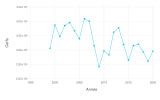

In [7]:
set_default_plot_size(16cm, 10cm)
df = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
plot(df, x=:Année, y=:Cerfs, Geom.line, Geom.point)

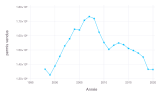

In [8]:
set_default_plot_size(16cm, 10cm)
plot(permis, x=:Année, y=:Total, Geom.line, Geom.point,
    Guide.ylabel("permis vendus"))

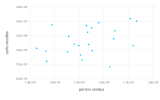

In [9]:
df2 = innerjoin(df, permis, on = :Année)

plot(df2, x=:Total, y=:Cerfs, Geom.point,
    Guide.xlabel("permis vendus"),
    Guide.ylabel("cerfs récoltés"))

#### 2.2 Quantité de cerfs récoltés annuellement dans les différentes zones de chasse

On doit d'abord additionner le nombre de cerfs récoltés selon les différents engins de chasse.

In [10]:
zones = groupby(recolte, :Zone)  # On groupe les données par zone

new_df = DataFrame(Année = Int64[], Zone = Int64[], Cerfs= Int64[])  # On initialise un DataFrame vide

for zone in zones  # Pour chaque zone de chasse,
    
    # pour chaque année,
    # on additionne le nombre de cerfs récoltés selon les différents engins de chasse
    df = combine(groupby(zone, :Année), :Cerfs => sum => :Cerfs)  
    
    df2 = DataFrame(Année = df.Année, 
                    Zone = fill(unique(zone.Zone)[1], size(df, 1)),
                    Cerfs = df.Cerfs) 
    
    append!(new_df, df2)  # On ajoute l'information au DataFrame préinitialisé 
end

sort!(new_df, :Année)
first(new_df, 5)  

,Année,Zone,Cerfs
,Int64,Int64,Int64
1,1999,2,922
2,1999,3,1519
3,1999,4,4890
4,1999,5,2014
5,1999,6,4846


In [11]:
groupby(new_df, :Zone)[1].Zone[1]

1

In [12]:
zones = unique(new_df[!, :Zone])
pp = Plot[]
set_default_plot_size(16cm, 10cm)
for i = 1:length(zones)
    p = plot(groupby(new_df, :Zone)[i], x=:Année, y=:Cerfs, Geom.point, Geom.line, Guide.title("Zone $(groupby(new_df, :Zone)[i].Zone[1])"))
    push!(pp, p)
end

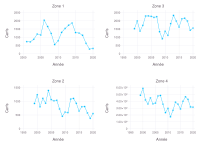

In [13]:
# Pour afficher seulement les 4 premières zones 

p = reshape(pp[1:4], (2,2))

set_default_plot_size(20cm, 15cm)
gridstack(p)

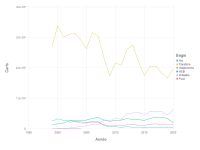

In [14]:
test_df = groupby(recolte, :Engin)
# print(test_df)

annees = (groupby(recolte, :Année)) # On groupe les données par zone

# wtv1 = groupby(annees, :Engin)

new_df = DataFrame(Année = Int64[], Engin= String15[],Cerfs= Int64[])  # On initialise un DataFrame vide

for engin in test_df  # Pour chaque zone de chasse,
    
    # pour chaque année,
    # on additionne le nombre de cerfs récoltés selon les différents engins de chasse
    df = combine(groupby(engin, :Année), :Cerfs => sum => :Cerfs)
#     print(df)
    
    df2 = DataFrame(Année = df.Année, 
                    Engin = fill(unique(engin.Engin)[1], size(df, 1)),
                    Cerfs = df.Cerfs) 
    
    append!(new_df, df2)  # On ajoute l'information au DataFrame préinitialisé 
end

# (test_df)

sort!(new_df, :Année)
first(new_df, 5)  
plot(new_df, x=:Année, y=:Cerfs, color=:Engin, Geom.line)

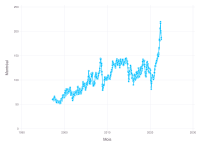

In [15]:
mtl = layer(essence, x=:Mois, y=:Montréal, Geom.line, Geom.point)
quebec = layer(essence, x=:Mois, y=:Québec, Geom.line, Geom.point)
plot(mtl, quebec)

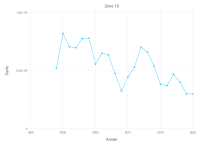

In [16]:
pp[10]

In [26]:

temp = layer(meteo, x=:"Date/Time", y=:"Mean Temp (°C)", Geom.line, Geom.point)
snow_grnd = layer(meteo, x=:"Date/Time", y=:"Snow on Grnd (cm)", Geom.line, Geom.point)
# meteo."Snow on Grnd (cm)"

plot(snow_grnd)


In [ ]:
# transform(meteo, :"Date/Time" => ByRow(year) => :"Date/Time")
meteo_hiver = combine(groupby(transform(meteo, :"Date/Time" => ByRow(year) => :"Date/Time"), :"Date/Time"), :"Mean Temp (°C)" => mean => :"Mean Temp (°C)")
cerfs = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
meteo_hiver[!, :Cerfs] = cerfs.Cerfs
plot(meteo_hiver, x=:"Mean Temp (°C)", y=:Cerfs, Geom.line, Geom.point)

In [57]:
# transform(meteo, :"Date/Time" => ByRow(month) => :"Date/Time")."Date/Time"

meteo[!, :Mois] = transform(meteo, :"Date/Time" => ByRow(month) => :"Date/Time")."Date/Time"


8036-element Vector{Int64}:
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1
  ⋮
 12
 12
 12
 12
 12
 12
 12
 12
 12
 12
 12
 12

---
## 3. Ajustement d'un modèle de régression linéaire simple

Pour cet exemple simple, on n'utilise que l'année comme variable explicative afin d'ajuster un modèle de régression linéaire pour chaque zone de chasse.

#### 3.1. Ajustement des modèles 

In [19]:
models = DataFrame(Zone = Int64[], β̂₀ = Float64[], β̂₁ = Float64[])  # On initialise le DataFrame vide

zones = groupby(new_df, :Zone)  # On groupe les données par zone
for zone in zones  # Pour chaque zone de chasse,

    y = zone.Cerfs
    n = length(y)
    
    x₁ = zone.Année  # On considère l'année seulement
    
    X = hcat(ones(n), x₁)

    β̂₀, β̂₁ =  X'X\X'y  # Estimation des coefficients de régression
    
    push!(models, [zone.Zone[1], β̂₀, β̂₁])  # On ajoute ça au DataFame
end

models

LoadError: ArgumentError: column name :Zone not found in the data frame

#### 3.2. Validation graphique

Pour avoir un aperçu de la qualité de la regression, on ajoute la droite de régression.

In [20]:
zones = unique(new_df[!, :Zone])

pp = Plot[]

set_default_plot_size(10cm, 6cm)
for i = 1:length(zones)
    p = plot(groupby(new_df, :Zone)[i], x=:Année, y=:Cerfs, Geom.point, Geom.line, Guide.title("Zone $(groupby(new_df, :Zone)[i].Zone[1])"),
            intercept=[models[i, :β̂₀]], slope=[models[i, :β̂₁]], Geom.abline(style=:dash, color="red"))
    push!(pp, p)
end

LoadError: ArgumentError: column name :Zone not found in the data frame

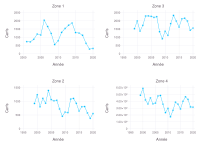

In [21]:
# Pour afficher les 4 premières zones 

p = reshape(pp[1:4], (2,2))

set_default_plot_size(20cm, 15cm)
gridstack(p)

---
## 4. Estimation du nombre de cerfs mâles adultes récoltés par zone de chasse en 2021 

On utilise le modèle simple de la section précédente pour estimer le nombre de cerfs récoltés pour chacune des lignes de l'ensemble de test.

#### 4.1 Chargement des données de l'ensemble de test

In [22]:
test = CSV.read("data/test.csv", DataFrame);

#### 4.2 Estimation du nombre de cerfs récoltés pour chacune des ligne de l'ensemble de test.

In [23]:
models = models[in.(models.Zone, Ref(test.Zone)), :];  # On récupère seulement les modèles pour les zones à prévoir

In [24]:
ŷ = [Int64(ceil(models[i,:].β̂₁ * 2021 + models[i,:].β̂₀)) for i in 1:size(test,1)];

LoadError: BoundsError: attempt to access 0×3 DataFrame at index [1, :]

#### 4.3 Préparation du fichier des préditions pour téléverser sur Kaggle

Le fichier *benchmark_predictions.csv* généré peut être téléversé sur Kaggle. Il est composé d'une colonne de zones (Zone) et d'une colonne du nombre de cerfs récoltés (Cerfs).

In [25]:
prediction = DataFrame(Zone = test.Zone, Cerfs = ŷ)

CSV.write("benchmark_predictions.csv", prediction)

LoadError: UndefVarError: ŷ not defined